# London Restaurant Analysis

## Import Libraries

In [43]:
import pandas as pd
import numpy as np 
import pandas as pd
import urllib.request
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
import json
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values
import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe
import matplotlib.cm as cm
import matplotlib.colors as colors
from sklearn.cluster import KMeans
from sklearn.datasets.samples_generator import make_blobs
import folium # map rendering library
from bs4 import BeautifulSoup
import lxml
import time
from urllib.request import urlopen
from geopy.geocoders import Nominatim
from sklearn.cluster import KMeans
from sklearn import datasets
from yellowbrick.cluster import KElbowVisualizer

In [44]:
#pip install yellowbrick

In [45]:
page = "https://en.m.wikipedia.org/wiki/List_of_areas_of_London"
html = urlopen(page)
soup = BeautifulSoup(html, 'html.parser')

In [46]:
tables = soup.find_all('table')

In [47]:
locations = []
london_boroughs = []
post_towns = []
post_codes = []

for table in tables:
    rows = table.find_all('tr')
    
    for row in rows:
        cells = row.find_all('td')
        
        
        if len(cells) > 1:
            location = cells[0]
            locations.append(str(location.text))
            
            london_borough = cells[1]
            london_boroughs.append(london_borough.text.strip())
            
            post_town = cells[2]
            post_towns.append(post_town.text.strip())
            
            post_code = cells[3]
            post_codes.append(post_code.text.strip())

In [48]:
d = {'Locations':locations,'London Boroughs':london_boroughs, 'Towns': post_towns, 'Post Codes': post_codes}
df_london = pd.DataFrame(d,columns=['Locations','London Boroughs','Towns','Post Codes'])
df_london.head(30)

,Locations,London Boroughs,Towns,Post Codes
0,Abbey Wood,"Bexley, Greenwich [7]",LONDON,SE2
1,Acton,"Ealing, Hammersmith and Fulham[8]",LONDON,"W3, W4"
2,Addington,Croydon[8],CROYDON,CR0
3,Addiscombe,Croydon[8],CROYDON,CR0
4,Albany Park,Bexley,"BEXLEY, SIDCUP","DA5, DA14"
5,Aldborough Hatch,Redbridge[9],ILFORD,IG2
6,Aldgate,City[10],LONDON,EC3
7,Aldwych,Westminster[10],LONDON,WC2
8,Alperton,Brent[11],WEMBLEY,HA0
9,Anerley,Bromley[11],LONDON,SE20


### Let's foucus on Towns which are closer to London

In [49]:
df_london_central = df_london[df_london['Towns'].str.contains("LONDON")].reset_index(drop=True)

In [192]:
df_london.shape

(531, 4)

In [50]:
df_london_central.head()

,Locations,London Boroughs,Towns,Post Codes
0,Abbey Wood,"Bexley, Greenwich [7]",LONDON,SE2
1,Acton,"Ealing, Hammersmith and Fulham[8]",LONDON,"W3, W4"
2,Aldgate,City[10],LONDON,EC3
3,Aldwych,Westminster[10],LONDON,WC2
4,Anerley,Bromley[11],LONDON,SE20


### Now let's add some coordinate data to this dataframe. For this we will use geopy in a loop.

In [51]:
locations_new=df_london_central['Locations']

In [52]:
latitudes = []
longitudes =[]
locations_not_found = []





for i in range(len(locations_new)):
    address = locations_new[i]
    geolocator = Nominatim(user_agent="london_explorer")
    location = geolocator.geocode(address)
    if location is not None:
        latitude = location.latitude
        longitude = location.longitude
        latitudes.append(latitude)
        longitudes.append(longitude)
        print('The coordinates for {} are {} and {}'.format(locations_new[i], latitude, longitude))
    else:
        latitudes.insert(i, float(0))
        longitudes.insert(i, float(0))
        locations_not_found.insert(i, '{}'.format(locations_new[i]))
        print('No location found for {}'.format(locations_new[i]))


The coordinates for Abbey Wood are 51.487621 and 0.1140504
The coordinates for Acton are 51.5081402 and -0.2732607
The coordinates for Aldgate are 51.5142477 and -0.0757186
The coordinates for Aldwych are 52.9286192 and -1.520567
The coordinates for Anerley are 51.4075993 and -0.0619394
The coordinates for Angel are 51.5318417 and -0.1057137
The coordinates for Archway are 51.5654371 and -0.1349977
The coordinates for Arkley are 51.6455827 and -0.236258
The coordinates for Arnos Grove are 51.6164024 and -0.1332873
The coordinates for Balham are 49.4916263 and 4.1611971
The coordinates for Bankside are 51.5074991 and -0.0993021
The coordinates for Barbican are 51.5201501 and -0.0986832
The coordinates for Barnes are 46.9310489 and -98.0678849
The coordinates for Barnet Gate are 51.6418265 and -0.2429855
The coordinates for Barnsbury are 51.5389351 and -0.114735
The coordinates for Battersea are 51.4707933 and -0.172214
The coordinates for Bayswater are -31.909036 and 115.90391349431482


### Notice that some locations were not found and some of them have incorrect lattitude and longitudes assinged. This is becomes they are common names which also exists in other parts of the world. To fix this I have created a new list which will hold these location names and I will need to add 'London' to them and run geopy again.

In [53]:
len(locations_new)

308

In [54]:
df_london_central

,Locations,London Boroughs,Towns,Post Codes
0,Abbey Wood,"Bexley, Greenwich [7]",LONDON,SE2
1,Acton,"Ealing, Hammersmith and Fulham[8]",LONDON,"W3, W4"
2,Aldgate,City[10],LONDON,EC3
3,Aldwych,Westminster[10],LONDON,WC2
4,Anerley,Bromley[11],LONDON,SE20
5,Angel,Islington[8],LONDON,"EC1, N1"
6,Archway,Islington[12],LONDON,N19
7,Arkley,Barnet[12],"BARNET, LONDON","EN5, NW7"
8,Arnos Grove,Enfield[12],LONDON,"N11, N14"
9,Balham,Wandsworth[13],LONDON,SW12


### Let's first assign the Latitude and Longitude values to our dataframe.

In [55]:
df_london_central['Latitudes']= latitudes
df_london_central['Longitudes']= longitudes
df_london_central

,Locations,London Boroughs,Towns,Post Codes,Latitudes,Longitudes
0,Abbey Wood,"Bexley, Greenwich [7]",LONDON,SE2,51.487621,0.114050
1,Acton,"Ealing, Hammersmith and Fulham[8]",LONDON,"W3, W4",51.508140,-0.273261
2,Aldgate,City[10],LONDON,EC3,51.514248,-0.075719
3,Aldwych,Westminster[10],LONDON,WC2,52.928619,-1.520567
4,Anerley,Bromley[11],LONDON,SE20,51.407599,-0.061939
5,Angel,Islington[8],LONDON,"EC1, N1",51.531842,-0.105714
6,Archway,Islington[12],LONDON,N19,51.565437,-0.134998
7,Arkley,Barnet[12],"BARNET, LONDON","EN5, NW7",51.645583,-0.236258
8,Arnos Grove,Enfield[12],LONDON,"N11, N14",51.616402,-0.133287
9,Balham,Wandsworth[13],LONDON,SW12,49.491626,4.161197


### Notice here that the location for row 12 and 19 are outstanding from the rest. Let's first fix the issue with these wrong values. For this we will create a new list and run a for loop which will sweep this dataframe and find any location which has a longitude which is greater than +/- 2.

In [56]:
list_of_false_coordinates = []
for i in range(len(longitudes)):
    if longitudes[i] < -0.3:
        list_of_false_coordinates.append(i)
    elif longitudes[i] > 0.3:
        list_of_false_coordinates.append(i)
    elif latitudes[i] < 51.0:
        list_of_false_coordinates.append(i)
    elif latitudes[i] > 52.0:
        list_of_false_coordinates.append(i)

In [57]:
list_of_false_coordinates

[3,
 9,
 12,
 16,
 19,
 21,
 25,
 35,
 38,
 42,
 47,
 50,
 57,
 61,
 62,
 75,
 82,
 89,
 99,
 108,
 110,
 111,
 118,
 122,
 134,
 139,
 146,
 150,
 157,
 164,
 170,
 171,
 173,
 175,
 187,
 191,
 214,
 215,
 230,
 231,
 237,
 242,
 243,
 251,
 252,
 257,
 259,
 279,
 285,
 286,
 290,
 296,
 297,
 303,
 304]

### I than add 'London' to the location name and put them in a seperate string.

In [58]:
list_of_false_coordinates_names=[]
mystring=' London'
for i in list_of_false_coordinates:
    list_of_false_coordinates_names.append(df_london_central['Locations'][i])

for i in range(0, len(list_of_false_coordinates_names)):
    list_of_false_coordinates_names[i] += mystring

In [59]:
list_of_false_coordinates_names

['Aldwych London',
 'Balham London',
 'Barnes London',
 'Bayswater London',
 'Bedford Park London',
 'Bellingham London',
 'Bexleyheath (also Bexley New Town) London',
 'Brent Park London',
 'Bromley (also Bromley-by-Bow) London',
 'Burroughs, The London',
 'Cann Hall London',
 'Castelnau London',
 'Chinatown London',
 'Church End London',
 'Church End London',
 'Custom House London',
 'Ealing London',
 'Edmonton London',
 'Forest Hill London',
 'Grange Park London',
 'Grove Park London',
 'Grove Park London',
 'The Hale London',
 'Hanwell London',
 'Homerton London',
 'The Hyde London',
 'Kenton London',
 'Kingsbury London',
 'Lee London',
 'Little Venice London',
 'Maryland London',
 'Marylebone (also St Marylebone) London',
 'Maze Hill London',
 'Middle Park London',
 'Newington London',
 'North Kensington London',
 'Queensbury London',
 'Ratcliff London',
 'Somerstown London',
 'South Hackney London',
 'Southend London',
 'St Giles London',
 'St Johns London',
 'Stonebridge London'

### Now let's run Geopy again for this list with adjusted location names.

In [60]:
latitudes_new=[]
longitudes_new=[]
for i in range(len(list_of_false_coordinates_names)):
    address = list_of_false_coordinates_names[i]
    geolocator = Nominatim(user_agent="london_explorer")
    location = geolocator.geocode(address)
    if location is not None:
        latitude= location.latitude
        longitude= location.longitude
        latitudes_new.append(latitude)
        longitudes_new.append(longitude)
        print('The coordinates for {} are {} and {}'.format(list_of_false_coordinates_names[i], latitude, longitude))
    else:
        latitudes_new.insert(i, float(0))
        longitudes_new.insert(i, float(0))
        print('No location found for {}'.format(list_of_false_coordinates_names[i]))

The coordinates for Aldwych London are 51.5126247 and -0.1185681
The coordinates for Balham London are 51.4447487 and -0.1512937
The coordinates for Barnes London are 51.4718962 and -0.2387441
The coordinates for Bayswater London are 51.5122764 and -0.1883854
The coordinates for Bedford Park London are 51.498020100000005 and -0.25564718577152973
The coordinates for Bellingham London are 51.4311004 and -0.0244895
No location found for Bexleyheath (also Bexley New Town) London
The coordinates for Brent Park London are 51.5639957 and -0.27590641378489267
No location found for Bromley (also Bromley-by-Bow) London
The coordinates for Burroughs, The London are 51.5883045 and -0.2286063
The coordinates for Cann Hall London are 51.55743685 and 0.015681373492808938
The coordinates for Castelnau London are 51.485688 and -0.2330301
The coordinates for Chinatown London are 51.511624499999996 and -0.13050227288652327
The coordinates for Church End London are 51.601117 and -0.1918901
The coordinates

In [61]:

for i in range(len(longitudes_new)):
    if latitudes_new[i] == 0.0:
        print('Location for {} is false'.format(list_of_false_coordinates_names[i]))
    elif longitudes_new[i] != 0:
        if longitudes_new[i] < -0.4:
            print('Longitude value for {} is false'.format(list_of_false_coordinates_names[i]))
        elif longitudes_new[i] > 0.4:
            print('Longitude value for {} is false'.format(list_of_false_coordinates_names[i]))
        elif latitudes_new[i] < 51.0:
            print('Latitude value for {} is false'.format(list_of_false_coordinates_names[i]))
        elif latitudes_new[i] > 52.0:
            print('Latitude value for {} is false'.format(list_of_false_coordinates_names[i]))
        

Location for Bexleyheath (also Bexley New Town) London is false
Location for Bromley (also Bromley-by-Bow) London is false
Location for Marylebone (also St Marylebone) London is false
Location for Somerstown London is false
Longitude value for Southend London is false
Location for Sydenham (also Lower Sydenham, Upper Sydenham) London is false


In [62]:
def return_false(x,ls):
    if x in ls:
        return ls.index(x)


In [63]:
return_false('Southend London',list_of_false_coordinates_names)

40

In [64]:
return_false('Somerstown London',list_of_false_coordinates_names)

38

In [65]:
list_of_false_coordinates_names[40] += ' Lewisham'

In [66]:
list_of_false_coordinates_names[40]

'Southend London Lewisham'

In [67]:
list_of_false_coordinates_names[38] = 'Somers Town'

In [68]:
list_of_false_coordinates_names[38]

'Somers Town'

In [69]:
list_of_false_coordinates_names

['Aldwych London',
 'Balham London',
 'Barnes London',
 'Bayswater London',
 'Bedford Park London',
 'Bellingham London',
 'Bexleyheath (also Bexley New Town) London',
 'Brent Park London',
 'Bromley (also Bromley-by-Bow) London',
 'Burroughs, The London',
 'Cann Hall London',
 'Castelnau London',
 'Chinatown London',
 'Church End London',
 'Church End London',
 'Custom House London',
 'Ealing London',
 'Edmonton London',
 'Forest Hill London',
 'Grange Park London',
 'Grove Park London',
 'Grove Park London',
 'The Hale London',
 'Hanwell London',
 'Homerton London',
 'The Hyde London',
 'Kenton London',
 'Kingsbury London',
 'Lee London',
 'Little Venice London',
 'Maryland London',
 'Marylebone (also St Marylebone) London',
 'Maze Hill London',
 'Middle Park London',
 'Newington London',
 'North Kensington London',
 'Queensbury London',
 'Ratcliff London',
 'Somers Town',
 'South Hackney London',
 'Southend London Lewisham',
 'St Giles London',
 'St Johns London',
 'Stonebridge Lond

In [70]:
latitudes_new=[]
longitudes_new=[]
for i in range(len(list_of_false_coordinates_names)):
    address = list_of_false_coordinates_names[i]
    geolocator = Nominatim(user_agent="london_explorer")
    location = geolocator.geocode(address)
    if location is not None:
        latitude= location.latitude
        longitude= location.longitude
        latitudes_new.append(latitude)
        longitudes_new.append(longitude)
        print('The coordinates for {} are {} and {}'.format(list_of_false_coordinates_names[i], latitude, longitude))
    else:
        latitudes_new.insert(i, float(0))
        longitudes_new.insert(i, float(0))
        print('No location found for {}'.format(list_of_false_coordinates_names[i]))

The coordinates for Aldwych London are 51.5126247 and -0.1185681
The coordinates for Balham London are 51.4447487 and -0.1512937
The coordinates for Barnes London are 51.4718962 and -0.2387441
The coordinates for Bayswater London are 51.5122764 and -0.1883854
The coordinates for Bedford Park London are 51.498020100000005 and -0.25564718577152973
The coordinates for Bellingham London are 51.4311004 and -0.0244895
No location found for Bexleyheath (also Bexley New Town) London
The coordinates for Brent Park London are 51.5639957 and -0.27590641378489267
No location found for Bromley (also Bromley-by-Bow) London
The coordinates for Burroughs, The London are 51.5883045 and -0.2286063
The coordinates for Cann Hall London are 51.55743685 and 0.015681373492808938
The coordinates for Castelnau London are 51.485688 and -0.2330301
The coordinates for Chinatown London are 51.511624499999996 and -0.13050227288652327
The coordinates for Church End London are 51.601117 and -0.1918901
The coordinates

In [71]:
for i in range(len(longitudes_new)):
    if latitudes_new[i] == 0.0:
        print('Location for {} is false'.format(list_of_false_coordinates_names[i]))
    elif longitudes_new[i] != 0:
        if longitudes_new[i] < -0.4:
            print('Longitude value for {} is false'.format(list_of_false_coordinates_names[i]))
        elif longitudes_new[i] > 0.4:
            print('Longitude value for {} is false'.format(list_of_false_coordinates_names[i]))
        elif latitudes_new[i] < 51.0:
            print('Latitude value for {} is false'.format(list_of_false_coordinates_names[i]))
        elif latitudes_new[i] > 52.0:
            print('Latitude value for {} is false'.format(list_of_false_coordinates_names[i]))
  

Location for Bexleyheath (also Bexley New Town) London is false
Location for Bromley (also Bromley-by-Bow) London is false
Location for Marylebone (also St Marylebone) London is false
Location for Sydenham (also Lower Sydenham, Upper Sydenham) London is false


### Now I will correct the false values in our dataframe.

In [72]:
x=0
while x < (len(latitudes_new)): 
    for i in list_of_false_coordinates: 
        df_london_central['Latitudes'][i]=latitudes_new[x]
        df_london_central['Longitudes'][i]=longitudes_new[x]
        x= x+1

<ipython-input-72-8a6c32ceb2f1>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_london_central['Latitudes'][i]=latitudes_new[x]
<ipython-input-72-8a6c32ceb2f1>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_london_central['Longitudes'][i]=longitudes_new[x]


In [73]:
df_london_central.head()

,Locations,London Boroughs,Towns,Post Codes,Latitudes,Longitudes
0,Abbey Wood,"Bexley, Greenwich [7]",LONDON,SE2,51.487621,0.114050
1,Acton,"Ealing, Hammersmith and Fulham[8]",LONDON,"W3, W4",51.508140,-0.273261
2,Aldgate,City[10],LONDON,EC3,51.514248,-0.075719
3,Aldwych,Westminster[10],LONDON,WC2,51.512625,-0.118568
4,Anerley,Bromley[11],LONDON,SE20,51.407599,-0.061939


### Now I will fix the locations that were never found in the first place.

In [74]:
locations_not_found

['Bexleyheath (also Bexley New Town)',
 'Bromley (also Bromley-by-Bow)',
 'Marylebone (also St Marylebone)',
 'Sydenham (also Lower Sydenham, Upper Sydenham)']

In [75]:
for i in range(len(locations_not_found)):
    print(df_london_central[df_london_central['Locations']== locations_not_found[i]].index.values)

[25]
[38]
[171]
[257]


### Notice that the locations not found all contain an extra with "(also xxxx)" in the naming convention. I decide that this is causing geopy to not find the coordinates. So I used .split function to filter the name.

In [76]:
for i in range(0, len(locations_not_found)):

    locations_not_found[i] = locations_not_found[i].split()[0]

latitudes_locations_not_found = []
longitudes_locations_not_found = []
for i in range(len(locations_not_found)):
    address = locations_not_found[i]
    geolocator = Nominatim(user_agent="london_explorer")
    location = geolocator.geocode(address)
    if location is not None:
        latitude= location.latitude
        longitude= location.longitude
        latitudes_locations_not_found.append(latitude)
        longitudes_locations_not_found.append(longitude)
        print('The coordinates for {} are {} and {}'.format(locations_not_found[i], latitude, longitude))
    else:
        latitudes_locations_not_found.insert(i, float(0))
        longitudes_locations_not_found.insert(i, float(0))
        print('No location found for {}'.format(locations_not_found[i]))

The coordinates for Bexleyheath are 51.4634854 and 0.1480552
The coordinates for Bromley are 51.4028046 and 0.0148142
The coordinates for Marylebone are 51.5220589 and -0.1504553
The coordinates for Sydenham are 51.4267658 and -0.0523877


### Now that I have the locations I will be placing them in the correct row of our dataframe.

In [77]:
index_list = [25,38,171,257]
x=0
while x < (len(latitudes_locations_not_found)):
    for i in index_list:
        df_london_central['Latitudes'][i]=latitudes_locations_not_found[x]
        df_london_central['Longitudes'][i]=longitudes_locations_not_found[x]
        x= x+1

<ipython-input-77-68b9ba061ee7>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_london_central['Latitudes'][i]=latitudes_locations_not_found[x]
<ipython-input-77-68b9ba061ee7>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_london_central['Longitudes'][i]=longitudes_locations_not_found[x]


### The dataframe is now ready to use.

In [78]:
df_london_central.head()

,Locations,London Boroughs,Towns,Post Codes,Latitudes,Longitudes
0,Abbey Wood,"Bexley, Greenwich [7]",LONDON,SE2,51.487621,0.114050
1,Acton,"Ealing, Hammersmith and Fulham[8]",LONDON,"W3, W4",51.508140,-0.273261
2,Aldgate,City[10],LONDON,EC3,51.514248,-0.075719
3,Aldwych,Westminster[10],LONDON,WC2,51.512625,-0.118568
4,Anerley,Bromley[11],LONDON,SE20,51.407599,-0.061939


### I will now use folium to map he boroughs in central london.

In [79]:
map_central_london = folium.Map(location=[latitude, longitude], zoom_start=11)

# add markers to map
for lat, lng, borough, neighborhood in zip(df_london_central['Latitudes'], df_london_central['Longitudes'], df_london_central['London Boroughs'], df_london_central['Locations']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_central_london)  
    
map_central_london

### Foursquare API credentials. Since this is shared publicly I have hidden the credentials.

In [80]:
CLIENT_ID = '' # your Foursquare ID
CLIENT_SECRET = '' # your Foursquare Secret
ACCESS_TOKEN = '' # your FourSquare Access Token
VERSION = ''
LIMIT = 100
radius = 500

In [81]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [82]:
london_venues = getNearbyVenues(names=df_london_central['Locations'],
                                   latitudes=df_london_central['Latitudes'],
                                   longitudes=df_london_central['Longitudes']
                                  )

Abbey Wood
Acton
Aldgate
Aldwych
Anerley
Angel
Archway
Arkley
Arnos Grove
Balham
Bankside
Barbican
Barnes
Barnet Gate
Barnsbury
Battersea
Bayswater
Beckenham
Beckton
Bedford Park
Belgravia
Bellingham
Belsize Park
Bermondsey
Bethnal Green
Bexleyheath (also Bexley New Town)
Blackfriars
Blackheath
Blackheath Royal Standard
Blackwall
Bloomsbury
Bounds Green
Bow
Bowes Park
Brent Cross
Brent Park
Brixton
Brockley
Bromley (also Bromley-by-Bow)
Brompton
Brondesbury
Brunswick Park
Burroughs, The
Camberwell
Cambridge Heath
Camden Town
Canary Wharf
Cann Hall
Canning Town
Canonbury
Castelnau
Catford
Chalk Farm
Charing Cross
Charlton
Chelsea
Childs Hill
Chinatown
Chinbrook
Chingford
Chiswick
Church End
Church End
Clapham
Clerkenwell
Colindale
Colliers Wood
Colney Hatch
Covent Garden
Cricklewood
Crofton Park
Crossness
Crouch End
Crystal Palace
Cubitt Town
Custom House
Dalston
De Beauvoir Town
Denmark Hill
Deptford
Dollis Hill
Dulwich
Ealing
Earls Court
Earlsfield
East Dulwich
East Finchley
East Ham


In [83]:
london_venues_backup = london_venues

In [84]:
print('{} venues were returned by Foursquare.'.format(london_venues.shape[0]))

9748 venues were returned by Foursquare.


### I grouped the data by neighborhood and checked how many values were returned for each column.

In [85]:
london_venues.groupby('Neighborhood').count().head()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Abbey Wood,3,3,3,3,3,3
Acton,27,27,27,27,27,27
Aldgate,100,100,100,100,100,100
Aldwych,100,100,100,100,100,100
Anerley,6,6,6,6,6,6


In [86]:
print('There are {} uniques categories.'.format(len(london_venues['Venue Category'].unique())))

There are 390 uniques categories.


### Let's view the top 5 Categories returned.

In [88]:
london_venues_top=london_venues.groupby('Venue Category').count()

In [89]:
london_venues_top.sort_values('Neighborhood',ascending=False).head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude
Venue Category,,,,,,
Coffee Shop,630,630,630,630,630,630
Pub,625,625,625,625,625,625
Café,561,561,561,561,561,561
Hotel,340,340,340,340,340,340
Grocery Store,329,329,329,329,329,329


### Than I checked the unique values returned.

In [90]:
# one hot encoding
london_onehot = pd.get_dummies(london_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
london_onehot['Neighborhood'] = london_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [london_onehot.columns[-1]] + list(london_onehot.columns[:-1])
london_onehot = london_onehot[fixed_columns]

london_onehot.head()

,Zoo Exhibit,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Australian Restaurant,Austrian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bar,Baseball Field,Bathing Area,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Boarding House,Boat or Ferry,Bookstore,Botanical Garden,Boutique,Bowling Alley,Boxing Gym,Brasserie,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buddhist Temple,Building,Burger Joint,Burrito Place,Bus Station,Bus Stop,Business Service,Butcher,Café,Camera Store,Campground,Canal,Canal Lock,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Castle,Caucasian Restaurant,Chaat Place,Champagne Bar,Cheese Shop,Child Care Service,Chinese Restaurant,Chocolate Shop,Church,Cigkofte Place,Circus School,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Cafeteria,College Quad,College Science Building,Comedy Club,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cricket Ground,Cuban Restaurant,Cupcake Shop,Cycle Studio,Czech Restaurant,Dam,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Dog Run,Doner Restaurant,Donut Shop,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,English Restaurant,Escape Room,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Film Studio,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Football Stadium,Forest,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,Gelato Shop,General College & University,General Entertainment,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,Herbs & Spices Store,Hill,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hostel,Hotel,Hotel Bar,Housing Development,Hunan Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Knitting Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Leather Goods Store,Lebanese Restaurant,Library,Light Rail Station,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Mamak Restaurant,Market,Martial Arts School,Massage Studio,Mattress Store,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Movie Theater,Multiplex,Museum,Music Store,Music Venue,Nail Salon,Nature Preserve,Neighborhood,New American Restaurant,Newsagent,Nightclub,Noodle House,North Indian Restaurant,Office,Okonomiyaki Restaurant,Opera House,Optical Shop,Organic Grocery,Other Repair Shop,Outdoor Sculpture,Outdoor Supply Store,Outdoors & Recreation,Pakistani Restaurant,Palace,Paper / Office Supplies Store,Park,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Perfume Shop,Persian Restaurant,Peruvian Resta

In [91]:
london_grouped = london_onehot.groupby('Neighborhood').mean().reset_index()
london_grouped

,Neighborhood,Zoo Exhibit,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport Terminal,American Restaurant,Antique Shop,Aquarium,Arcade,Arepa Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Australian Restaurant,Austrian Restaurant,Auto Dealership,Auto Garage,Auto Workshop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bar,Baseball Field,Bathing Area,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Boarding House,Boat or Ferry,Bookstore,Botanical Garden,Boutique,Bowling Alley,Boxing Gym,Brasserie,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buddhist Temple,Building,Burger Joint,Burrito Place,Bus Station,Bus Stop,Business Service,Butcher,Café,Camera Store,Campground,Canal,Canal Lock,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Castle,Caucasian Restaurant,Chaat Place,Champagne Bar,Cheese Shop,Child Care Service,Chinese Restaurant,Chocolate Shop,Church,Cigkofte Place,Circus School,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Cafeteria,College Quad,College Science Building,Comedy Club,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cricket Ground,Cuban Restaurant,Cupcake Shop,Cycle Studio,Czech Restaurant,Dam,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distillery,Dive Bar,Dog Run,Doner Restaurant,Donut Shop,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,English Restaurant,Escape Room,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Film Studio,Fish & Chips Shop,Fish Market,Fishing Spot,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Football Stadium,Forest,Fountain,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,Gelato Shop,General College & University,General Entertainment,German Restaurant,Gift Shop,Gluten-free Restaurant,Golf Course,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Heliport,Herbs & Spices Store,Hill,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hostel,Hotel,Hotel Bar,Housing Development,Hunan Restaurant,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Indoor Play Area,Intersection,Irish Pub,Israeli Restaurant,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kebab Restaurant,Kids Store,Kitchen Supply Store,Knitting Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Leather Goods Store,Lebanese Restaurant,Library,Light Rail Station,Lingerie Store,Liquor Store,Locksmith,Lounge,Malay Restaurant,Mamak Restaurant,Market,Martial Arts School,Massage Studio,Mattress Store,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Molecular Gastronomy Restaurant,Monument / Landmark,Moroccan Restaurant,Motorcycle Shop,Movie Theater,Multiplex,Museum,Music Store,Music Venue,Nail Salon,Nature Preserve,New American Restaurant,Newsagent,Nightclub,Noodle House,North Indian Restaurant,Office,Okonomiyaki Restaurant,Opera House,Optical Shop,Organic Grocery,Other Repair Shop,Outdoor Sculpture,Outdoor Supply Store,Outdoors & Recreation,Pakistani Restaurant,Palace,Paper / Office Supplies Store,Park,Pastry Shop,Pedestrian Plaza,Performing Arts Venue,Perfume Shop,Persian Restaurant,Peruvian Resta

In [92]:
num_top_venues = 5

for hood in london_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = london_grouped[london_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

--Palmers Green----
               venue  freq
0               Café  0.13
1  Indian Restaurant  0.13
2                Pub  0.07
3     Breakfast Spot  0.07
4             Bakery  0.07


----Park Royal----
                  venue  freq
0  Gym / Fitness Center  0.11
1  Fast Food Restaurant  0.11
2                 Hotel  0.11
3         Movie Theater  0.11
4           Pizza Place  0.06


----Parsons Green----
                venue  freq
0  Italian Restaurant  0.11
1                Café  0.09
2                 Pub  0.07
3         Coffee Shop  0.07
4              Bakery  0.05


----Peckham----
                venue  freq
0       Grocery Store  0.08
1  Italian Restaurant  0.06
2               Hotel  0.06
3         Supermarket  0.04
4        Cocktail Bar  0.04


----Penge----
                  venue  freq
0           Pizza Place  0.20
1                   Pub  0.20
2  Fast Food Restaurant  0.13
3         Grocery Store  0.07
4                 Hotel  0.07


----Pentonville----
               venue 

In [93]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [94]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = london_grouped['Neighborhood']

for ind in np.arange(london_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(london_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head(10)

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Abbey Wood,Grocery Store,Campground,Fish & Chips Shop,Yoga Studio,Filipino Restaurant,Event Service,Event Space,Exhibit,Falafel Restaurant,Farm
1,Acton,Pub,Gym / Fitness Center,Fast Food Restaurant,Chinese Restaurant,Supermarket,Coffee Shop,Brewery,Massage Studio,Park,Grocery Store
2,Aldgate,Hotel,Coffee Shop,Cocktail Bar,Indian Restaurant,Pizza Place,Gym / Fitness Center,Pub,Café,Restaurant,Middle Eastern Restaurant
3,Aldwych,Pub,Restaurant,Theater,Coffee Shop,French Restaurant,Hotel,Burger Joint,Sandwich Place,Café,Museum
4,Anerley,Grocery Store,Convenience Store,Supermarket,Park,Fast Food Restaurant,Filipino Restaurant,Escape Room,Ethiopian Restaurant,Event Service,Event Space
5,Angel,Pub,Hotel,Coffee Shop,Café,Mediterranean Restaurant,Indian Restaurant,Garden,French Restaurant,Gym / Fitness Center,Food Truck
6,Archway,Grocery Store,Coffee Shop,Café,Pub,Pizza Place,Hotel,Italian Restaurant,Farmers Market,Asian Restaurant,Kebab Restaurant
7,Arkley,Golf Course,Yoga Studio,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Falafel Restaurant,Farm,Farmers Market
8,Arnos Grove,Grocery Store,Chinese Restaurant,Beer Bar,Park,Yoga Studio,Filipino Restaurant,Event Service,Event Space,Exhibit,Falafel Restaurant
9,Balham,Coffee Shop,Pub,Pizza Place,Indian Restaurant,Italian Restaurant,Bakery,Supermarket,Café,Sandwich Place,Bar


In [95]:
london_grouped_pubs = london_grouped[['Neighborhood', 'Pub']]

In [96]:
london_grouped_pubs.head()

,Neighborhood,Pub
0,Abbey Wood,0.000000
1,Acton,0.148148
2,Aldgate,0.040000
3,Aldwych,0.080000
4,Anerley,0.000000


In [97]:
kmeans = KMeans(n_clusters=3, init='k-means++', max_iter=15, random_state=8)
X = london_grouped_pubs.drop(['Neighborhood'], axis=1)

In [98]:
kmeans.fit(X)
kmeans.labels_[0:10]

array([0, 2, 0, 2, 0, 2, 2, 0, 0, 2])

In [99]:
def get_inertia(n_clusters):
    km = KMeans(n_clusters=n_clusters, init='k-means++', max_iter=15, random_state=8)
    km.fit(X)
    return km.inertia_

In [100]:
scores = [get_inertia(x) for x in range(2, 21)]

In [101]:
import matplotlib.pyplot as plt
import seaborn as sns

Text(0, 0.5, 'Error')

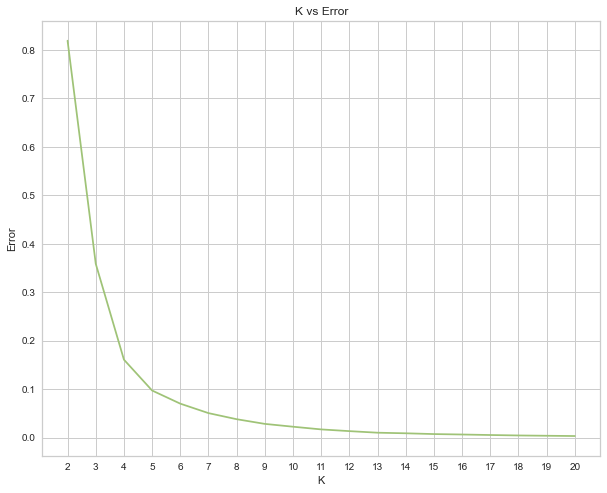

In [102]:
plt.figure(figsize=[10, 8])
sns.lineplot(x=range(2, 21), y=scores, color='g')
plt.title("K vs Error")
plt.xticks(range(2, 21))
plt.xlabel("K")
plt.ylabel("Error")

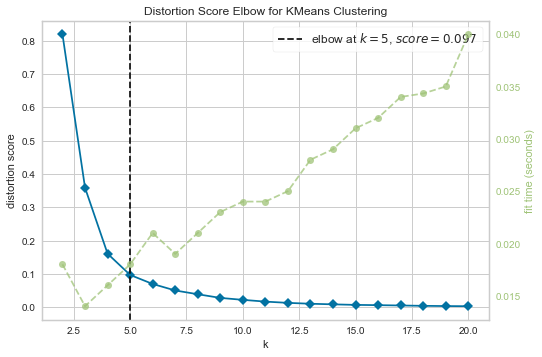

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [103]:
from yellowbrick.cluster import KElbowVisualizer
model = KMeans()
visualizer = KElbowVisualizer(model, k=(2,21))

visualizer.fit(X)        
visualizer.show()

Optimum K Value is 5

In [104]:
kclusters = 5

london_grouped_clustering = london_grouped_pubs.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(london_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([0, 2, 4, 4, 0, 4, 2, 0, 0, 2])

In [105]:
london_merged = london_grouped_pubs.copy()
london_merged['Cluster Labels']= kmeans.labels_

In [106]:
london_merged = london_merged.join(london_venues.set_index('Neighborhood'), on='Neighborhood')

In [107]:
london_merged.head()

,Neighborhood,Pub,Cluster Labels,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Abbey Wood,0.000000,0,51.487621,0.114050,Co-op Food,51.487490,0.113751,Grocery Store
0,Abbey Wood,0.000000,0,51.487621,0.114050,Frank's Fish Bar,51.487151,0.112231,Fish & Chips Shop
0,Abbey Wood,0.000000,0,51.487621,0.114050,Abbey Wood Caravan Club,51.485502,0.120014,Campground
1,Acton,0.148148,2,51.508140,-0.273261,London Star Hotel,51.509624,-0.272456,Hotel
1,Acton,0.148148,2,51.508140,-0.273261,The Aeronaut,51.508376,-0.275216,Pub


In [108]:
map_pubs_london = folium.Map(location=[latitude, longitude], zoom_start=11)

x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to map
for lat, lon, poi, cluster in zip(london_merged['Neighborhood Latitude'], london_merged['Neighborhood Longitude'], london_merged['Neighborhood'], london_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' - Cluster ' + str(cluster))
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill_color=rainbow[cluster-1],
        fill_opacity=0.8).add_to(map_pubs_london)
    
map_pubs_london

In [109]:
london_grouped_pubs["Cluster Labels"] = kmeans.labels_
london_grouped_pubs.head()

<ipython-input-109-48af89a381ce>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  london_grouped_pubs["Cluster Labels"] = kmeans.labels_


,Neighborhood,Pub,Cluster Labels
0,Abbey Wood,0.000000,0
1,Acton,0.148148,2
2,Aldgate,0.040000,4
3,Aldwych,0.080000,4
4,Anerley,0.000000,0


## Examining Clusters

In [110]:
df_new = df_london_central[['Locations', 'London Boroughs']]
df_new = df_new.rename(columns={'Locations':'Neighborhood'})
df_new.head()

,Neighborhood,London Boroughs
0,Abbey Wood,"Bexley, Greenwich [7]"
1,Acton,"Ealing, Hammersmith and Fulham[8]"
2,Aldgate,City[10]
3,Aldwych,Westminster[10]
4,Anerley,Bromley[11]


## Cluster 1

In [146]:
cluster1 = london_merged.loc[london_merged['Cluster Labels'] == 0]
df_cluster1 = pd.merge(df_new, cluster1, on='Neighborhood')
df_cluster1.head(10)

,Neighborhood,London Boroughs,Pub,Cluster Labels,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Abbey Wood,"Bexley, Greenwich [7]",0.0,0,51.487621,0.114050,Co-op Food,51.487490,0.113751,Grocery Store
1,Abbey Wood,"Bexley, Greenwich [7]",0.0,0,51.487621,0.114050,Frank's Fish Bar,51.487151,0.112231,Fish & Chips Shop
2,Abbey Wood,"Bexley, Greenwich [7]",0.0,0,51.487621,0.114050,Abbey Wood Caravan Club,51.485502,0.120014,Campground
3,Anerley,Bromley[11],0.0,0,51.407599,-0.061939,Aldi,51.408604,-0.059213,Supermarket
4,Anerley,Bromley[11],0.0,0,51.407599,-0.061939,Co-op Food,51.406243,-0.057830,Grocery Store
5,Anerley,Bromley[11],0.0,0,51.407599,-0.061939,Tesco Express,51.405853,-0.065041,Grocery Store
6,Anerley,Bromley[11],0.0,0,51.407599,-0.061939,H&H Kebab House,51.409031,-0.059266,Fast Food Restaurant
7,Anerley,Bromley[11],0.0,0,51.407599,-0.061939,Costcutter,51.405990,-0.057141,Convenience Store
8,Anerley,Bromley[11],0.0,0,51.407599,-0.061939,Betts Park,51.408755,-0.067278,Park
9,Arkley,Barnet[12],0.0,0,51.645583,-0.236258,Arkley Golf Club,51.647774,-0.233413,Golf Course


In [147]:
print('There are {} number of venues in cluster 1'.format(df_cluster1.shape[0]))

There are 2931 number of venues in cluster 1


In [172]:
print('There are {} Neighborhoods.'.format(len(df_cluster1['Neighborhood'].unique())))

There are 108 Neighborhoods.


In [186]:
print('There are {} unique Categories in cluster 1.'.format(len(df_cluster1['Venue Category'].unique())))

There are 297 unique Categories in cluster 1.


In [180]:
df_cluster1['Venue Category'].str.contains("Pub").value_counts()

False    2902
True       29
Name: Venue Category, dtype: int64

# Cluster 2

In [149]:
cluster2 = london_merged.loc[london_merged['Cluster Labels'] == 1]
df_cluster2 = pd.merge(df_new, cluster2, on='Neighborhood')
df_cluster2.head(10)

,Neighborhood,London Boroughs,Pub,Cluster Labels,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Barnet Gate,Barnet,0.333333,1,51.641827,-0.242985,The Gate,51.641994,-0.242582,Pub
1,Barnet Gate,Barnet,0.333333,1,51.641827,-0.242985,Hadley FC,51.642660,-0.243032,Soccer Field
2,Barnet Gate,Barnet,0.333333,1,51.641827,-0.242985,Barnet Gate Wood,51.639062,-0.242836,Forest
3,Bexleyheath (also Bexley New Town),Bexley[26],0.400000,1,51.463485,0.148055,The Traveller's Home,51.463449,0.150954,Pub
4,Bexleyheath (also Bexley New Town),Bexley[26],0.400000,1,51.463485,0.148055,The Yacht,51.466340,0.145112,Pub
5,Bexleyheath (also Bexley New Town),Bexley[26],0.400000,1,51.463485,0.148055,Co-op Food,51.465449,0.146523,Grocery Store
6,Bexleyheath (also Bexley New Town),Bexley[26],0.400000,1,51.463485,0.148055,Russell Park,51.463112,0.148876,Playground
7,Bexleyheath (also Bexley New Town),Bexley[26],0.400000,1,51.463485,0.148055,One Stop,51.465762,0.146127,Convenience Store
8,Castelnau,Richmond upon Thames[43],0.428571,1,51.485688,-0.233030,Sips'n'Bites,51.485214,-0.233585,Café
9,Castelnau,Richmond upon Thames[43],0.428571,1,51.485688,-0.233030,Spoonful,51.485313,-0.233358,French Restaurant


In [150]:
print("There are {} number of venues in cluster 2".format(df_cluster2.shape[0]))

There are 48 number of venues in cluster 2


In [151]:
print('There are {} Neighborhoods.'.format(len(df_cluster2['Neighborhood'].unique())))

There are 8 Neighborhoods.


In [185]:
print('There are {} unique Categories in cluster 2.'.format(len(df_cluster2['Venue Category'].unique())))

There are 21 unique Categories in cluster 2.


In [181]:
df_cluster2['Venue Category'].str.contains("Pub").value_counts()

False    29
True     19
Name: Venue Category, dtype: int64

# Cluster 3

In [191]:
cluster3 = london_merged.loc[london_merged['Cluster Labels'] == 2]
df_cluster3 = pd.merge(df_new, cluster3, on='Neighborhood')
df_cluster3.head(10)

,Neighborhood,London Boroughs,Pub,Cluster Labels,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Acton,"Ealing, Hammersmith and Fulham[8]",0.148148,2,51.50814,-0.273261,London Star Hotel,51.509624,-0.272456,Hotel
1,Acton,"Ealing, Hammersmith and Fulham[8]",0.148148,2,51.50814,-0.273261,The Aeronaut,51.508376,-0.275216,Pub
2,Acton,"Ealing, Hammersmith and Fulham[8]",0.148148,2,51.50814,-0.273261,MrBakeme,51.508452,-0.268543,Creperie
3,Acton,"Ealing, Hammersmith and Fulham[8]",0.148148,2,51.50814,-0.273261,Dragonfly Brewery at George & Dragon,51.507378,-0.271702,Brewery
4,Acton,"Ealing, Hammersmith and Fulham[8]",0.148148,2,51.50814,-0.273261,Acton Centre,51.506608,-0.266878,Gym / Fitness Center
5,Acton,"Ealing, Hammersmith and Fulham[8]",0.148148,2,51.50814,-0.273261,Amigo's Peri Peri,51.508396,-0.274561,Fast Food Restaurant
6,Acton,"Ealing, Hammersmith and Fulham[8]",0.148148,2,51.50814,-0.273261,PureGym,51.508326,-0.277150,Gym / Fitness Center
7,Acton,"Ealing, Hammersmith and Fulham[8]",0.148148,2,51.50814,-0.273261,Park+Bridge,51.508382,-0.267084,Wine Shop
8,Acton,"Ealing, Hammersmith and Fulham[8]",0.148148,2,51.50814,-0.273261,The Talbot,51.506527,-0.273585,Pub
9,Acton,"Ealing, Hammersmith and Fulham[8]",0.148148,2,51.50814,-0.273261,Lidl,51.507793,-0.270210,Supermarket


In [153]:
print("There are {} number of venues in cluster 3".format(df_cluster3.shape[0]))

There are 2698 number of venues in cluster 3


In [154]:
print('There are {} Neighborhoods.'.format(len(df_cluster3['Neighborhood'].unique())))

There are 75 Neighborhoods.


In [187]:
print('There are {} unique Categories in cluster 3.'.format(len(df_cluster3['Venue Category'].unique())))

There are 276 unique Categories in cluster 3.


In [182]:
df_cluster3['Venue Category'].str.contains("Pub").value_counts()

False    2409
True      289
Name: Venue Category, dtype: int64

# Cluster 4

In [155]:
cluster4 = london_merged.loc[london_merged['Cluster Labels'] == 3]
df_cluster4 = pd.merge(df_new, cluster4, on='Neighborhood')
df_cluster4.head(10)

,Neighborhood,London Boroughs,Pub,Cluster Labels,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Blackheath Royal Standard,Greenwich,0.25,3,51.478392,0.021284,Mara Interiors & Café,51.477672,0.019368,Furniture / Home Store
1,Blackheath Royal Standard,Greenwich,0.25,3,51.478392,0.021284,M&S Simply Food,51.476772,0.020189,Grocery Store
2,Blackheath Royal Standard,Greenwich,0.25,3,51.478392,0.021284,The British Oak,51.476161,0.026150,Pub
3,Blackheath Royal Standard,Greenwich,0.25,3,51.478392,0.021284,Standard Fish Bar,51.476722,0.021685,Fast Food Restaurant
4,Blackheath Royal Standard,Greenwich,0.25,3,51.478392,0.021284,The Royal Standard,51.476717,0.018799,Pub
5,Blackheath Royal Standard,Greenwich,0.25,3,51.478392,0.021284,Moca,51.476833,0.021119,Deli / Bodega
6,Blackheath Royal Standard,Greenwich,0.25,3,51.478392,0.021284,Sun Ya,51.476918,0.019469,Chinese Restaurant
7,Blackheath Royal Standard,Greenwich,0.25,3,51.478392,0.021284,Royal Grill Cafe,51.476910,0.020801,Café
8,Blackheath Royal Standard,Greenwich,0.25,3,51.478392,0.021284,Blackheath Complementary Healthcentre,51.477579,0.019344,Spa
9,Blackheath Royal Standard,Greenwich,0.25,3,51.478392,0.021284,Brother's Bakery,51.477043,0.018729,Bakery


In [156]:
print("There are {} number of venues in cluster 4".format(df_cluster4.shape[0]))

There are 335 number of venues in cluster 4


In [157]:
print('There are {} Neighborhoods.'.format(len(df_cluster4['Neighborhood'].unique())))

There are 26 Neighborhoods.


In [188]:
print('There are {} unique Categories in cluster 4.'.format(len(df_cluster4['Venue Category'].unique())))

There are 94 unique Categories in cluster 4.


In [183]:
df_cluster4['Venue Category'].str.contains("Pub").value_counts()

False    269
True      66
Name: Venue Category, dtype: int64

# Cluster 5

In [158]:
cluster5 = london_merged.loc[london_merged['Cluster Labels'] == 4]
df_cluster5 = pd.merge(df_new, cluster5, on='Neighborhood')
df_cluster5.head(10)

,Neighborhood,London Boroughs,Pub,Cluster Labels,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Aldgate,City[10],0.04,4,51.514248,-0.075719,Dorsett City London,51.514036,-0.075812,Hotel
1,Aldgate,City[10],0.04,4,51.514248,-0.075719,The Association,51.513733,-0.079132,Coffee Shop
2,Aldgate,City[10],0.04,4,51.514248,-0.075719,Hotel Indigo,51.512740,-0.075920,Hotel
3,Aldgate,City[10],0.04,4,51.514248,-0.075719,Katsu Wrap,51.515883,-0.077849,Food Truck
4,Aldgate,City[10],0.04,4,51.514248,-0.075719,Discount Suit Company,51.516705,-0.075506,Cocktail Bar
5,Aldgate,City[10],0.04,4,51.514248,-0.075719,Benk + Bo,51.515731,-0.075875,Bakery
6,Aldgate,City[10],0.04,4,51.514248,-0.075719,Hotel Motel One London-Tower Hill,51.512635,-0.075513,Hotel
7,Aldgate,City[10],0.04,4,51.514248,-0.075719,1n1 Fashion Pizza,51.516037,-0.075865,Pizza Place
8,Aldgate,City[10],0.04,4,51.514248,-0.075719,1Rebel,51.515569,-0.080040,Gym / Fitness Center
9,Aldgate,City[10],0.04,4,51.514248,-0.075719,Mattarello,51.515518,-0.075434,Italian Restaurant


In [159]:
print("There are {} number of venues in cluster 5".format(df_cluster5.shape[0]))

There are 3826 number of venues in cluster 5


In [145]:
print('There are {} Neighborhoods.'.format(len(df_cluster5['Neighborhood'].unique())))

There are 88 Neighborhoods.


In [189]:
print('There are {} unique Categories in cluster 5.'.format(len(df_cluster5['Venue Category'].unique())))

There are 294 unique Categories in cluster 5.


In [184]:
df_cluster5['Venue Category'].str.contains("Pub").value_counts()

False    3584
True      242
Name: Venue Category, dtype: int64

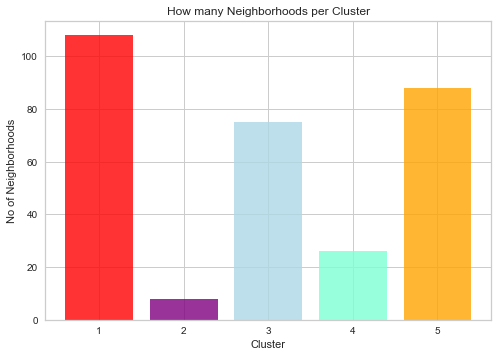

In [166]:
objects = (1,2,3,4,5)
y_pos = np.arange(len(objects))
performance = london_grouped_pubs['Cluster Labels'].value_counts().to_frame().sort_index(ascending=True)
perf = performance['Cluster Labels'].tolist()
plt.bar(y_pos, perf, align='center', alpha=0.8, color=['red', 'purple', 'lightblue','aquamarine','orange'])
plt.xticks(y_pos, objects)
plt.ylabel('No of Neighborhoods')
plt.xlabel('Cluster')
plt.title('How many Neighborhoods per Cluster')

plt.show()

In [140]:
performance

,Cluster Labels
0,108
1,8
2,75
3,26
4,88


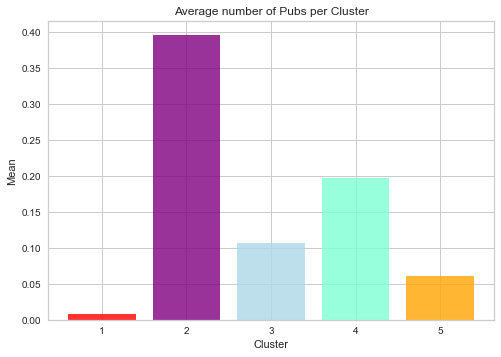

In [135]:
objects = (1,2,3,4,5)
clusters_mean = [df_cluster1['Pub'].mean(),df_cluster2['Pub'].mean(),df_cluster3['Pub'].mean(),df_cluster4['Pub'].mean(),df_cluster5['Pub'].mean()]
y_pos = np.arange(len(objects))
perf = clusters_mean
plt.bar(y_pos, perf, align='center', alpha=0.8, color=['red', 'purple', 'lightblue','aquamarine','orange'])
plt.xticks(y_pos, objects)
plt.ylabel('Mean')
plt.xlabel('Cluster')
plt.title('Average number of Pubs per Cluster')
plt.show()

In [136]:
clusters_mean

[0.008529512111907198,
 0.3958333333333333,
 0.10637509266123055,
 0.19701492537313436,
 0.06116048092002091]

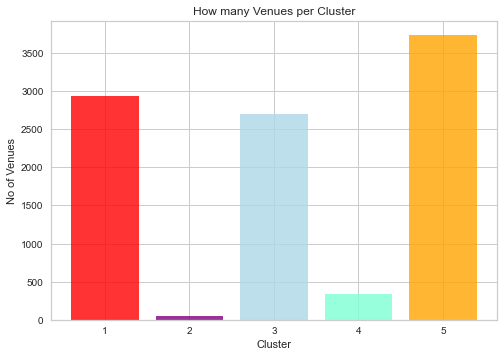

In [170]:
objects = (1,2,3,4,5)
y_pos = np.arange(len(objects))
performance = london_merged['Cluster Labels'].value_counts().to_frame().sort_index(ascending=True)
perf = performance['Cluster Labels'].tolist()
plt.bar(y_pos, perf, align='center', alpha=0.8, color=['red', 'purple', 'lightblue','aquamarine','orange'])
plt.xticks(y_pos, objects)
plt.ylabel('No of Venues')
plt.xlabel('Cluster')
plt.title('How many Venues per Cluster')

plt.show()